# Data Load

This script loads images and labels from a dataset directory containing 'train' and 'valid' subdirectories. It processes images for each class, counts the total images per class, and summarizes the dataset.



🔍 Loading images from: E:\Intern\MEGA-MINDS\Assign 4\Dataset\train

✅ Bacterial_spot: 2826 images
✅ Early_blight: 2455 images
✅ Late_blight: 3113 images
✅ Leaf_Mold: 2754 images
✅ Septoria_leaf_spot: 2882 images
✅ Spider_mites Two-spotted_spider_mite: 1747 images
✅ Target_Spot: 1827 images
✅ Tomato_Yellow_Leaf_Curl_Virus: 2036 images
✅ Tomato_mosaic_virus: 2153 images
✅ healthy: 3051 images
✅ powdery_mildew: 1004 images

📦 Total images: 25848
🔢 Classes found: 11

🔍 Loading images from: E:\Intern\MEGA-MINDS\Assign 4\Dataset\valid

✅ Bacterial_spot: 732 images
✅ Early_blight: 643 images
✅ Late_blight: 792 images
✅ Leaf_Mold: 739 images
✅ Septoria_leaf_spot: 746 images
✅ Spider_mites Two-spotted_spider_mite: 435 images
✅ Target_Spot: 457 images
✅ Tomato_Yellow_Leaf_Curl_Virus: 498 images
✅ Tomato_mosaic_virus: 584 images
✅ healthy: 805 images
✅ powdery_mildew: 252 images

📦 Total images: 6683
🔢 Classes found: 11


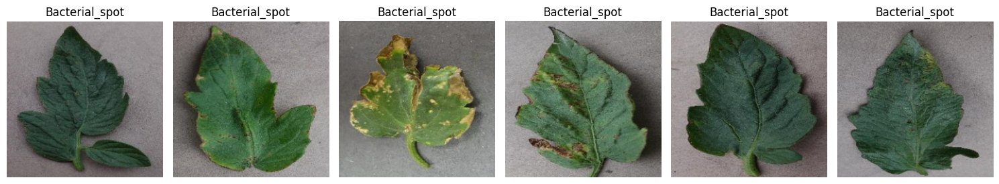

In [1]:
import os
import numpy as np
import cv2
from glob import glob
from collections import defaultdict
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
from matplotlib import pyplot as plt

class TomatoLeafDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []
        self.class_to_idx = {}
        self.idx_to_class = {}

        self._load_dataset()

    def _load_dataset(self):
        print(f"\n🔍 Loading images from: {self.root_dir}\n")
        class_names = sorted(os.listdir(self.root_dir))
        class_counts = defaultdict(int)

        for idx, class_name in enumerate(class_names):
            class_path = os.path.join(self.root_dir, class_name)
            if not os.path.isdir(class_path):
                continue

            self.class_to_idx[class_name] = idx
            self.idx_to_class[idx] = class_name

            img_files = glob(os.path.join(class_path, '*.*'))
            for img_path in img_files:
                self.image_paths.append(img_path)
                self.labels.append(idx)
                class_counts[class_name] += 1

            print(f"✅ {class_name}: {class_counts[class_name]} images")

        print(f"\n📦 Total images: {len(self.image_paths)}")
        print(f"🔢 Classes found: {len(self.class_to_idx)}")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label

# Transformation and dataset loading
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

train_path = "E:\\Intern\\MEGA-MINDS\\Assign 4\\Dataset\\train"
valid_path = "E:\\Intern\\MEGA-MINDS\\Assign 4\\Dataset\\valid"

train_dataset = TomatoLeafDataset(train_path, transform=transform)
valid_dataset = TomatoLeafDataset(valid_path, transform=transform)

# Visualization
def show_samples(dataset, num_samples=6):
    fig, axes = plt.subplots(1, num_samples, figsize=(15, 3))
    for i in range(num_samples):
        img, label = dataset[i]
        img = img.permute(1, 2, 0).numpy()
        img = (img * 0.5 + 0.5)
        axes[i].imshow(img)
        axes[i].set_title(dataset.idx_to_class[label])
        axes[i].axis("off")
    plt.tight_layout()
    plt.show()

# Show samples from the training dataset
show_samples(train_dataset)


# Preprocessing

- The Image Preprocessing Script resizes images to (224, 224) and normalises pixel values to [0, 1].  
- Preprocessed images are saved in `/kaggle/working/preprocessed_images` by class labels.  

- Saves processed photos as `.jpg`.  




In [3]:
import os
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

# === Settings ===
train_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\Dataset\\train"
valid_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\Dataset\\valid"
preprocessed_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images"
target_size = (224, 224)

# === Helper to Load Images and Labels ===
def load_images_from_folder(folder):
    images, labels = [], []
    print(f"\n🔍 Loading from: {folder}")
    for class_name in sorted(os.listdir(folder)):
        class_path = os.path.join(folder, class_name)
        if not os.path.isdir(class_path):
            continue
        img_files = glob(os.path.join(class_path, '*.*'))
        for img_path in img_files:
            img = cv2.imread(img_path)
            if img is not None:
                images.append(img)
                labels.append(class_name)
        print(f"✅ Loaded {len(img_files)} images for class '{class_name}'")
    return images, labels

# === Load All Images from Train and Valid ===
all_images, all_labels = [], []
for subdir in [train_dir, valid_dir]:
    imgs, lbls = load_images_from_folder(subdir)
    all_images.extend(imgs)
    all_labels.extend(lbls)

# === Preprocessing and Saving ===
os.makedirs(preprocessed_dir, exist_ok=True)
processed_count = 0
print("\n⚙️ Starting preprocessing and saving...\n")

for i, (img, label) in enumerate(tqdm(zip(all_images, all_labels), total=len(all_images))):
    resized_img = cv2.resize(img, target_size)
    normalized_img = resized_img / 255.0
    save_img = (normalized_img * 255).astype(np.uint8)

    class_dir = os.path.join(preprocessed_dir, label)
    os.makedirs(class_dir, exist_ok=True)
    img_path = os.path.join(class_dir, f"{i}.jpg")
    cv2.imwrite(img_path, save_img)
    processed_count += 1

print("\n✅ Preprocessing complete.")
print(f"📁 Saved preprocessed images to: {preprocessed_dir}")
print(f"📊 Total images processed: {processed_count}")
print(f"🔢 Classes found: {len(set(all_labels))}")


🔍 Loading from: E:\Intern\MEGA-MINDS\Assign 4\Dataset\train
✅ Loaded 2826 images for class 'Bacterial_spot'
✅ Loaded 2455 images for class 'Early_blight'
✅ Loaded 3113 images for class 'Late_blight'
✅ Loaded 2754 images for class 'Leaf_Mold'
✅ Loaded 2882 images for class 'Septoria_leaf_spot'
✅ Loaded 1747 images for class 'Spider_mites Two-spotted_spider_mite'
✅ Loaded 1827 images for class 'Target_Spot'
✅ Loaded 2036 images for class 'Tomato_Yellow_Leaf_Curl_Virus'
✅ Loaded 2153 images for class 'Tomato_mosaic_virus'
✅ Loaded 3051 images for class 'healthy'
✅ Loaded 1004 images for class 'powdery_mildew'

🔍 Loading from: E:\Intern\MEGA-MINDS\Assign 4\Dataset\valid
✅ Loaded 732 images for class 'Bacterial_spot'
✅ Loaded 643 images for class 'Early_blight'
✅ Loaded 792 images for class 'Late_blight'
✅ Loaded 739 images for class 'Leaf_Mold'
✅ Loaded 746 images for class 'Septoria_leaf_spot'
✅ Loaded 435 images for class 'Spider_mites Two-spotted_spider_mite'
✅ Loaded 457 images for cl

100%|██████████| 32531/32531 [03:30<00:00, 154.60it/s]



✅ Preprocessing complete.
📁 Saved preprocessed images to: E:\Intern\MEGA-MINDS\Assign 4\preprocessed_images
📊 Total images processed: 32531
🔢 Classes found: 11


# EDA

### Visualisation Summary  
1. Sample Images: Shows 3 random samples from each class in `/kaggle/working/preprocessed_images`.  
2. Class Distribution: Bar plot of class image counts to show imbalances.  

3. Details: Prints class distribution with image counts.  




🚀 Torch device in use: CUDA

📸 Visualizing 3 samples from each class...


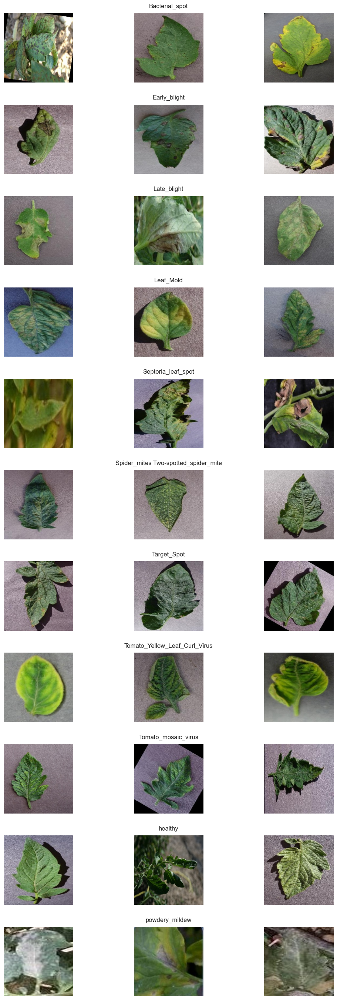


📊 Checking class distribution...


C:\Users\Himanshu Gaur\AppData\Local\Temp\ipykernel_20164\3714067140.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")


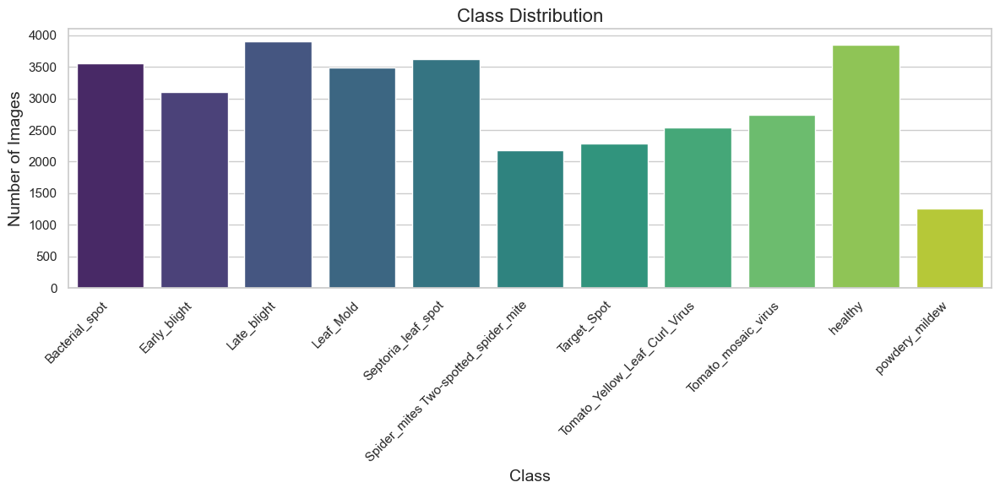

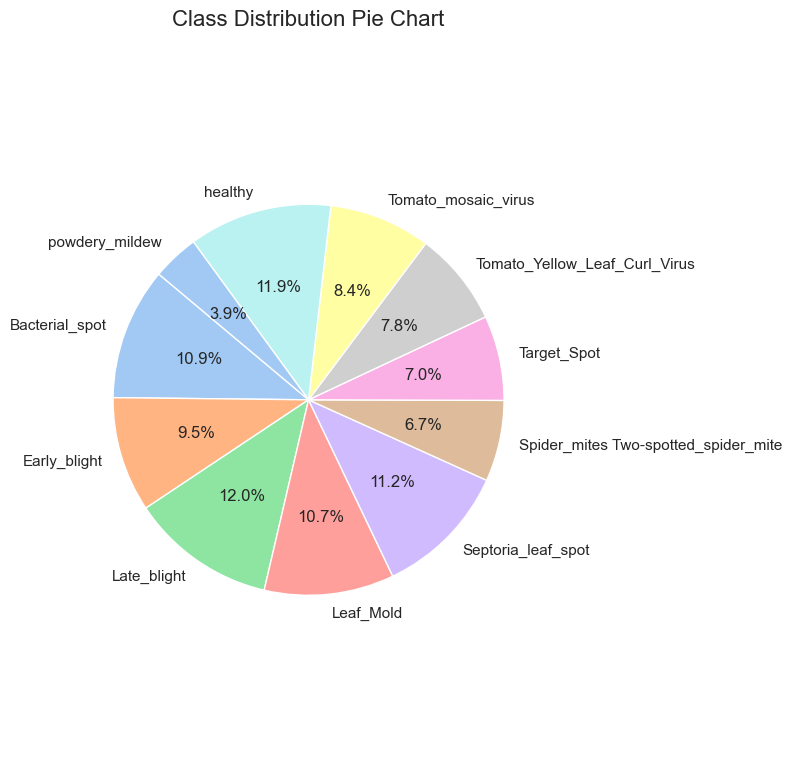


📋 Class distribution details:
Bacterial_spot: 3558 images
Early_blight: 3098 images
Late_blight: 3905 images
Leaf_Mold: 3493 images
Septoria_leaf_spot: 3628 images
Spider_mites Two-spotted_spider_mite: 2182 images
Target_Spot: 2284 images
Tomato_Yellow_Leaf_Curl_Virus: 2534 images
Tomato_mosaic_virus: 2737 images
healthy: 3856 images
powdery_mildew: 1256 images


In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import cv2
import torch
from collections import Counter

# Check for CUDA availability
torch_device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"\n🚀 Torch device in use: {torch_device.upper()}")

# Define the path to the preprocessed images directory
preprocessed_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images"

# Set up visualization styles
sns.set(style="whitegrid")

# 1. Visualize 3 samples from each class
print("\n📸 Visualizing 3 samples from each class...")

# Get a list of classes
classes = sorted(os.listdir(preprocessed_dir))
num_classes = len(classes)

# Set up the plot grid for 3 images per class
fig, axes = plt.subplots(nrows=num_classes, ncols=3, figsize=(12, num_classes * 2.5))
if num_classes == 1:
    axes = [axes]  # Handle single-class case

for i, class_name in enumerate(classes):
    class_path = os.path.join(preprocessed_dir, class_name)
    img_files = os.listdir(class_path)
    sample_images = random.sample(img_files, min(3, len(img_files)))

    for j in range(3):
        ax = axes[i][j] if num_classes > 1 else axes[j]
        if j < len(sample_images):
            img_path = os.path.join(class_path, sample_images[j])
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
        else:
            ax.axis('off')

        if j == 1:
            ax.set_title(class_name, fontsize=12, pad=10)
        ax.axis('off')

plt.tight_layout(pad=2.0)
plt.show()

# 2. Check class distribution for potential imbalances
print("\n📊 Checking class distribution...")

class_counts = {class_name: len(os.listdir(os.path.join(preprocessed_dir, class_name))) for class_name in classes}

plt.figure(figsize=(12, 6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")
plt.xlabel('Class', fontsize=14)
plt.ylabel('Number of Images', fontsize=14)
plt.title('Class Distribution', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 3. Optional: Pie chart for distribution
plt.figure(figsize=(8, 8))
plt.pie(class_counts.values(), labels=class_counts.keys(), autopct='%1.1f%%', startangle=140, colors=sns.color_palette("pastel"))
plt.axis('equal')
plt.title("Class Distribution Pie Chart", fontsize=16)
plt.tight_layout()
plt.show()

# Print class distribution details
print("\n📋 Class distribution details:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count} images")


###  Visualisation Summary:
- Pie Chart: Shows image proportions by class from `/kaggle/working/preprocessed_images`.  
- Highlights aid class balance determination.  



🚀 Torch device in use: CUDA

📸 Visualizing 3 samples from each class...


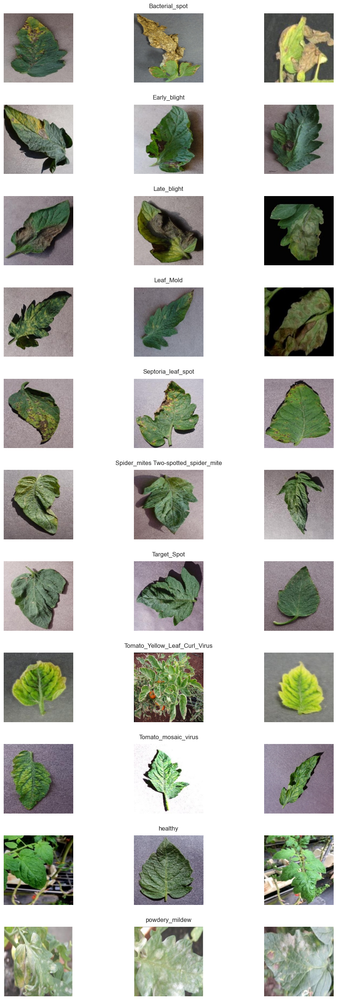


📊 Checking class distribution...


C:\Users\Himanshu Gaur\AppData\Local\Temp\ipykernel_20164\1779259435.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")


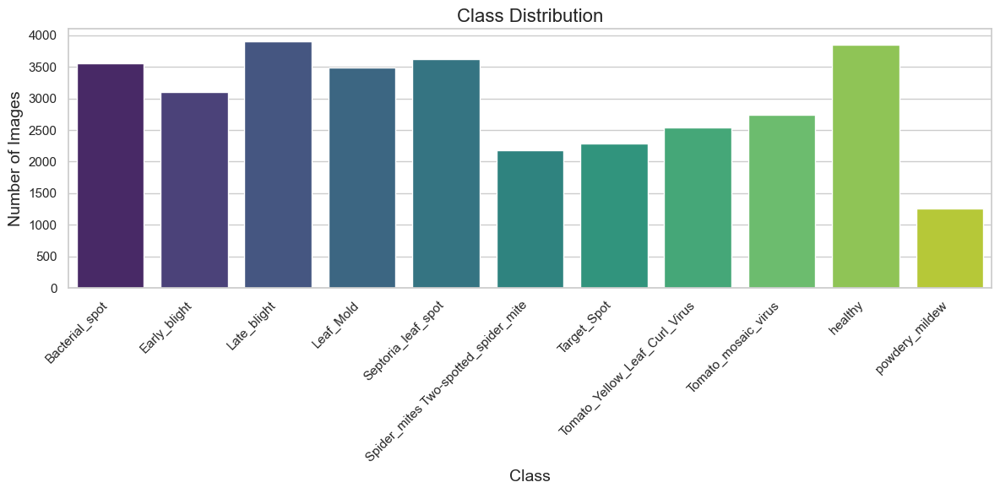


🥧 Generating pie chart for class proportions...


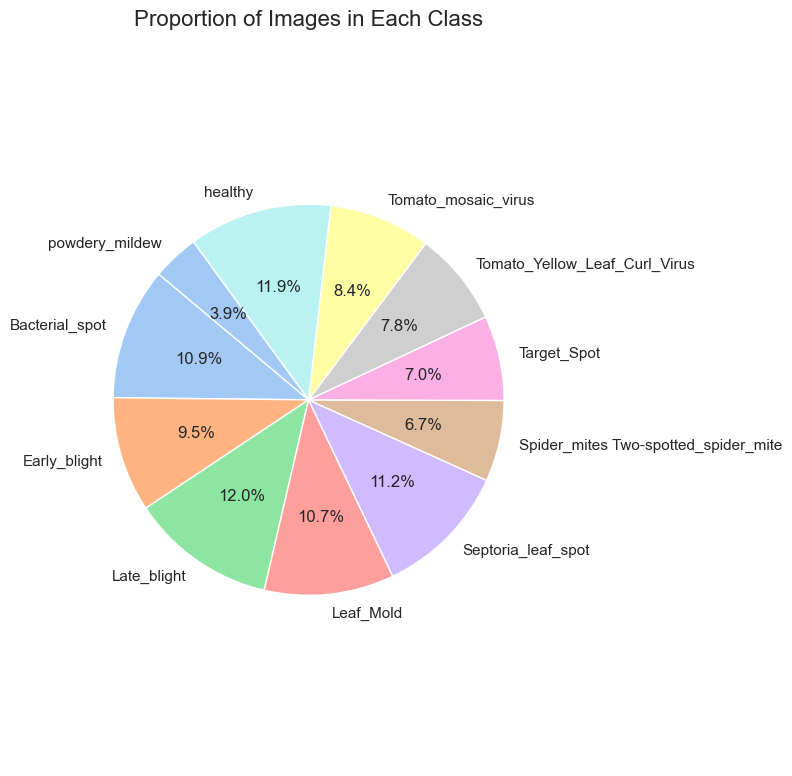


📋 Class distribution details:
Bacterial_spot: 3558 images
Early_blight: 3098 images
Late_blight: 3905 images
Leaf_Mold: 3493 images
Septoria_leaf_spot: 3628 images
Spider_mites Two-spotted_spider_mite: 2182 images
Target_Spot: 2284 images
Tomato_Yellow_Leaf_Curl_Virus: 2534 images
Tomato_mosaic_virus: 2737 images
healthy: 3856 images
powdery_mildew: 1256 images


In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import cv2
import torch
from collections import Counter

# Check for CUDA availability
torch_device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"\n🚀 Torch device in use: {torch_device.upper()}")

# Define the path to the preprocessed images directory
preprocessed_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images"


# Set up visualization styles
sns.set(style="whitegrid")

# 1. Visualize 3 samples from each class
print("\n📸 Visualizing 3 samples from each class...")

# Get a list of classes
classes = sorted(os.listdir(preprocessed_dir))
num_classes = len(classes)

# Set up the plot grid for 3 images per class
fig, axes = plt.subplots(nrows=num_classes, ncols=3, figsize=(12, num_classes * 2.5))
if num_classes == 1:
    axes = [axes]  # Handle single-class case

for i, class_name in enumerate(classes):
    class_path = os.path.join(preprocessed_dir, class_name)
    img_files = os.listdir(class_path)
    sample_images = random.sample(img_files, min(3, len(img_files)))

    for j in range(3):
        ax = axes[i][j] if num_classes > 1 else axes[j]
        if j < len(sample_images):
            img_path = os.path.join(class_path, sample_images[j])
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
        else:
            ax.axis('off')

        if j == 1:
            ax.set_title(class_name, fontsize=12, pad=10)
        ax.axis('off')

plt.tight_layout(pad=2.0)
plt.show()

# 2. Check class distribution for potential imbalances
print("\n📊 Checking class distribution...")

class_counts = {class_name: len(os.listdir(os.path.join(preprocessed_dir, class_name))) for class_name in classes}

plt.figure(figsize=(12, 6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")
plt.xlabel('Class', fontsize=14)
plt.ylabel('Number of Images', fontsize=14)
plt.title('Class Distribution', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 3. Pie chart - Proportion of Images in Each Class
print("\n🥧 Generating pie chart for class proportions...")
plt.figure(figsize=(8, 8))
plt.pie(class_counts.values(), labels=class_counts.keys(), autopct='%1.1f%%', startangle=140, colors=sns.color_palette("pastel"))
plt.axis('equal')
plt.title("Proportion of Images in Each Class", fontsize=16)
plt.tight_layout()
plt.show()

# Print class distribution details
print("\n📋 Class distribution details:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count} images")


# ResNet50 with Custom layers


- Use preprocessed photos with Gaussian noise augmentation to train a ResNet50 model.  
- Performance: Validation accuracy after 7 epochs; report and confusion matrix generated.  

- For optimised training, callbacks include early halting, ReduceLROnPlateau, and ModelCheckpoint.  



In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
import numpy as np
import os
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Define directory for preprocessed images
data_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images"

# Model parameters
batch_size = 32
img_height = 224
img_width = 224
epochs = 7
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\n🚀 Using device: {device}")

# Define transforms with Gaussian noise
class AddGaussianNoise:
    def __init__(self, mean=0., std=0.1):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

transform_train = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.RandomRotation(20),
    transforms.RandomHorizontalFlip(),
    transforms.RandomResizedCrop((img_height, img_width), scale=(0.8, 1.0)),
    transforms.ToTensor(),
    AddGaussianNoise(0., 0.1),
])

transform_val = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

# Load datasets
train_dataset = datasets.ImageFolder(data_dir, transform=transform_train)
val_dataset = datasets.ImageFolder(data_dir, transform=transform_val)

# Split dataset
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Load ResNet50
model = models.resnet50(pretrained=True)
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 512),
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(0.5),
    nn.Linear(512, 11),
    nn.Softmax(dim=1)
)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2)

best_val_loss = float('inf')
best_model_path = "best_model.pth"

# Training loop
for epoch in range(epochs):
    model.train()
    train_loss, correct, total = 0.0, 0, 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_loss /= total
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, correct, total = 0.0, 0, 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_loss /= total
    val_acc = correct / total

    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{epochs} => Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)

# Load best model
model.load_state_dict(torch.load(best_model_path))
model.eval()

# Final Evaluation
all_preds, all_labels = [], []
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(f'\n📊 Classification Report:\n{classification_report(all_labels, all_preds)}')
print(f'\n🧩 Confusion Matrix:\n{confusion_matrix(all_labels, all_preds)}')



🚀 Using device: cuda
Epoch 1/7 => Train Loss: 1.7668, Train Acc: 0.7943, Val Loss: 1.6752, Val Acc: 0.8761
Epoch 2/7 => Train Loss: 1.6701, Train Acc: 0.8808, Val Loss: 1.6360, Val Acc: 0.9099
Epoch 3/7 => Train Loss: 1.6523, Train Acc: 0.8971, Val Loss: 1.6385, Val Acc: 0.9078
Epoch 4/7 => Train Loss: 1.6391, Train Acc: 0.9089, Val Loss: 1.6177, Val Acc: 0.9268
Epoch 5/7 => Train Loss: 1.6301, Train Acc: 0.9178, Val Loss: 1.6204, Val Acc: 0.9259
Epoch 6/7 => Train Loss: 1.6236, Train Acc: 0.9231, Val Loss: 1.6126, Val Acc: 0.9331
Epoch 7/7 => Train Loss: 1.6182, Train Acc: 0.9288, Val Loss: 1.6106, Val Acc: 0.9347

📊 Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.86      0.91       671
           1       0.95      0.89      0.92       639
           2       0.90      0.92      0.91       751
           3       0.91      0.96      0.94       677
           4       0.83      0.90      0.86       755
           5       0.96  

- Objective: Visualise confusion matrix for ResNet50 model predictions.  
- Details: The matrix compares true and anticipated labels, annotated for clarity.  





🚀 Using device: cuda

📊 Classification Report:
                                      precision    recall  f1-score   support

                      Bacterial_spot       0.93      0.09      0.16      3558
                        Early_blight       0.85      0.33      0.48      3098
                         Late_blight       0.69      0.34      0.45      3905
                           Leaf_Mold       0.49      0.64      0.56      3493
                  Septoria_leaf_spot       0.63      0.69      0.66      3628
Spider_mites Two-spotted_spider_mite       0.95      0.71      0.81      2182
                         Target_Spot       0.99      0.47      0.64      2284
       Tomato_Yellow_Leaf_Curl_Virus       0.98      0.31      0.47      2534
                 Tomato_mosaic_virus       0.25      0.95      0.40      2737
                             healthy       0.54      0.90      0.67      3856
                      powdery_mildew       0.50      0.07      0.12      1256

              

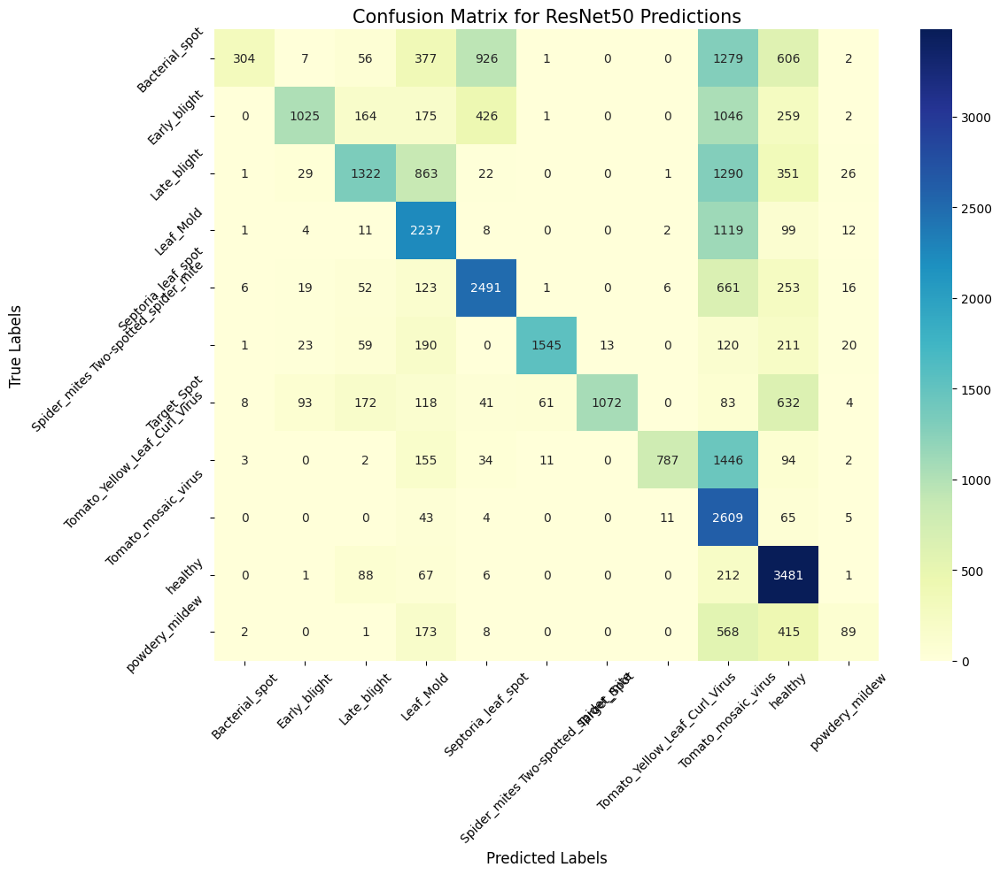

In [6]:
import torch
import torch.nn as nn
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# Constants
model_path = "E:\\Intern\\MEGA-MINDS\\Assign 4\\best_model.pth"
data_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images"
batch_size = 32
img_size = 224
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\n🚀 Using device: {device}")

# Transform for validation
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

# Load dataset and create dataloader
val_dataset = datasets.ImageFolder(data_dir, transform=transform)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
class_names = val_dataset.classes

# Load model architecture and weights
model = models.resnet50(pretrained=False)
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 512),
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(0.5),
    nn.Linear(512, len(class_names)),
    nn.Softmax(dim=1)
)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# Evaluation
all_preds, all_labels = [], []
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

# Metrics
print("\n📊 Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels", fontsize=12)
plt.ylabel("True Labels", fontsize=12)
plt.title("Confusion Matrix for ResNet50 Predictions", fontsize=15)
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()


# Plot Accuracy

- Objective: Visualise confusion matrix for ResNet50 model predictions.  
- Details: The matrix compares true and anticipated labels, annotated for clarity.  




🚀 Using device: cuda

📊 Classification Report:
                                      precision    recall  f1-score   support

                      Bacterial_spot       0.97      0.95      0.96       767
                        Early_blight       0.99      0.94      0.96       628
                         Late_blight       0.97      0.96      0.96       747
                           Leaf_Mold       0.94      0.99      0.97       687
                  Septoria_leaf_spot       0.94      0.94      0.94       741
Spider_mites Two-spotted_spider_mite       0.97      0.99      0.98       419
                         Target_Spot       0.99      0.97      0.98       455
       Tomato_Yellow_Leaf_Curl_Virus       0.99      0.99      0.99       507
                 Tomato_mosaic_virus       0.98      0.99      0.99       525
                             healthy       0.99      1.00      0.99       772
                      powdery_mildew       0.97      0.96      0.96       259

               

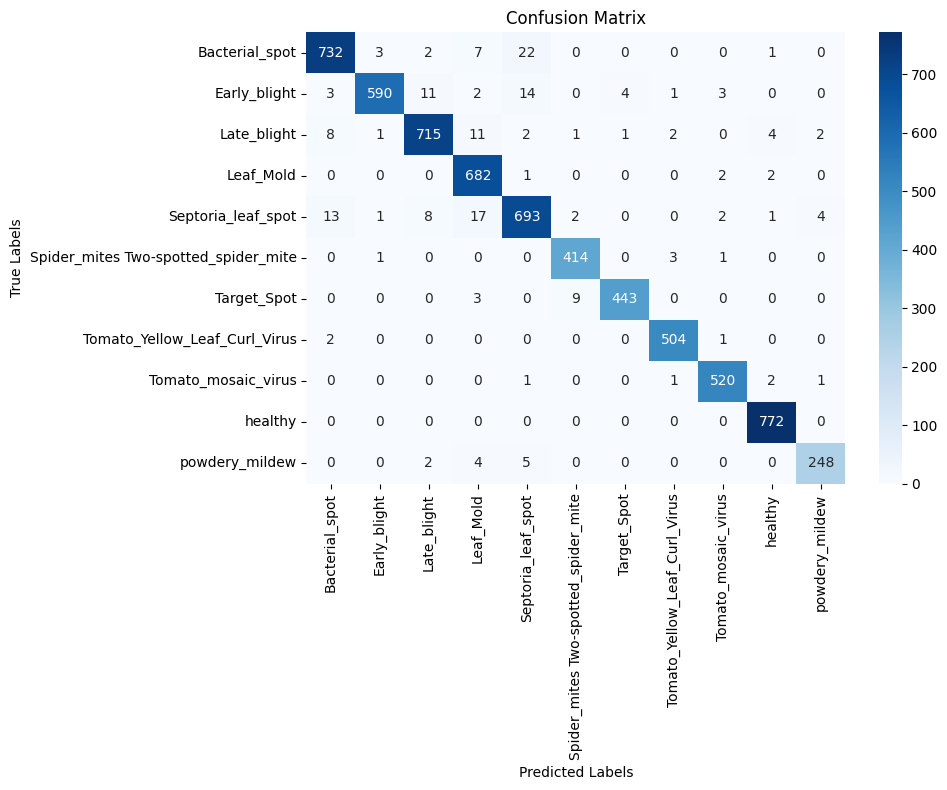

In [8]:
import torch
import torch.nn as nn
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import os
import warnings
warnings.filterwarnings('ignore')

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🚀 Using device: {device}")

# Define paths
data_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images"
model_path = "E:\\Intern\\MEGA-MINDS\\Assign 4\\best_model.pth"

# Image parameters
img_height, img_width = 224, 224
batch_size = 32

# Define transforms
transform = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

# Load dataset
dataset = datasets.ImageFolder(data_dir, transform=transform)
class_labels = dataset.classes

# Split into train/val
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
_, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Load model architecture and weights
model = models.resnet50(pretrained=False)
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 512),
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(0.5),
    nn.Linear(512, len(class_labels)),
    nn.Softmax(dim=1)
)
model.load_state_dict(torch.load(model_path, map_location=device))
model = model.to(device)
model.eval()

# Evaluate
all_preds, all_labels = [], []
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Classification report
print("\n📊 Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_labels))

# Confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)

# Plot Confusion Matrix
def plot_confusion_matrix(cm, class_labels):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(conf_matrix, class_labels)


# LIME

- The goal of LIME-Based Model Interpretability is to visualise explanations for model predictions.  
- Regions contributing to class predictions for 3 validation samples are marked.  




Using device: cuda


100%|██████████| 1000/1000 [00:08<00:00, 122.83it/s]


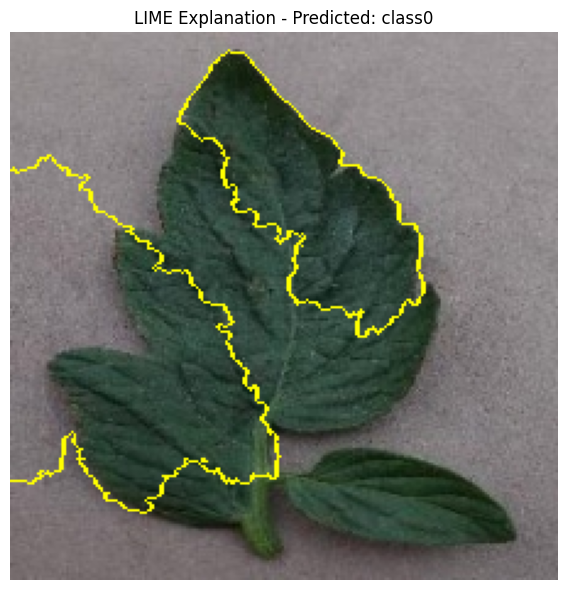

100%|██████████| 1000/1000 [00:08<00:00, 115.92it/s]


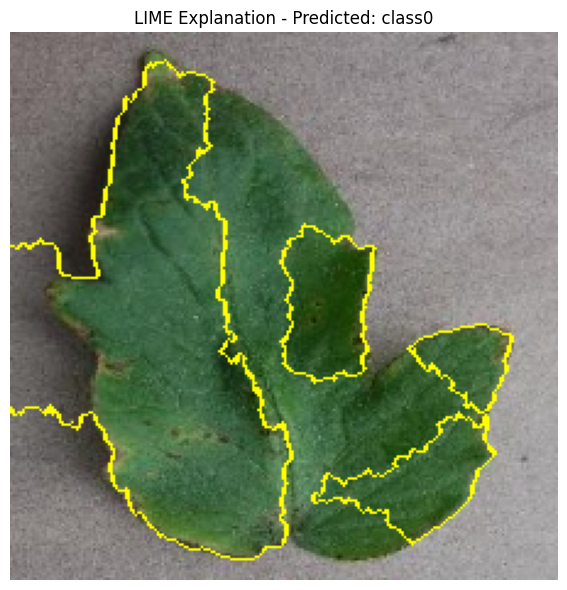

100%|██████████| 1000/1000 [00:08<00:00, 113.86it/s]


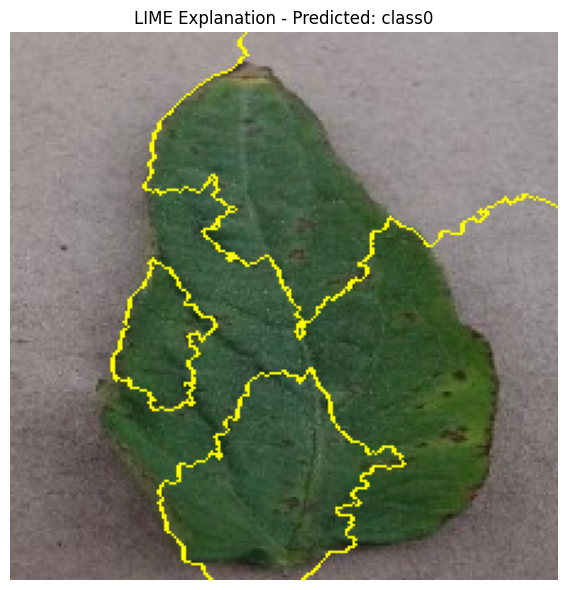

In [9]:
import torch
import torch.nn.functional as F
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
import os

# Config
model_path = "E:\\Intern\\MEGA-MINDS\\Assign 4\\best_model.pth"
data_dir = "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images"
num_samples = 3
class_labels = ['class0', 'class1', 'class2', 'class3', 'class4',
                'class5', 'class6', 'class7', 'class8', 'class9', 'class10']  # Update with actual labels

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define transformation (no augmentation)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Load dataset
dataset = datasets.ImageFolder(data_dir, transform=transform)
_, val_dataset = torch.utils.data.random_split(dataset, [int(0.8 * len(dataset)), len(dataset) - int(0.8 * len(dataset))])

# For visualization
val_dataset_vis = datasets.ImageFolder(data_dir, transform=transforms.Compose([
    transforms.Resize((224, 224)),
]))

# Load model
model = models.resnet50(pretrained=False)
model.fc = torch.nn.Sequential(
    torch.nn.Linear(model.fc.in_features, 512),
    torch.nn.ReLU(),
    torch.nn.BatchNorm1d(512),
    torch.nn.Dropout(0.5),
    torch.nn.Linear(512, 11),
)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# LIME explainer
explainer = lime_image.LimeImageExplainer()

# Prediction function for LIME
def batch_predict(images):
    model.eval()
    batch = torch.stack([transform(Image.fromarray(img)) for img in images], dim=0).to(device)
    with torch.no_grad():
        logits = model(batch)
        probs = F.softmax(logits, dim=1)
    return probs.cpu().numpy()

# Visualize LIME
for i in range(num_samples):
    img_path, _ = val_dataset_vis.samples[i]
    image = Image.open(img_path).convert('RGB')
    np_img = np.array(image)

    explanation = explainer.explain_instance(
        np_img,
        batch_predict,
        top_labels=1,
        hide_color=0,
        num_samples=1000
    )

    top_label = explanation.top_labels[0]
    temp, mask = explanation.get_image_and_mask(
        top_label,
        positive_only=True,
        num_features=10,
        hide_rest=False
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(mark_boundaries(temp, mask))
    plt.title(f"LIME Explanation - Predicted: {class_labels[top_label]}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()


# Predict Image

- picture Prediction with ResNet50 Model - Objective: Predict tomato leaf picture class using trained model.  
- Details: One of 11 illness categories is assigned to the preprocessed picture.  

- Visualisation: Shows the image's expected class label.



🚀 Using device: cuda


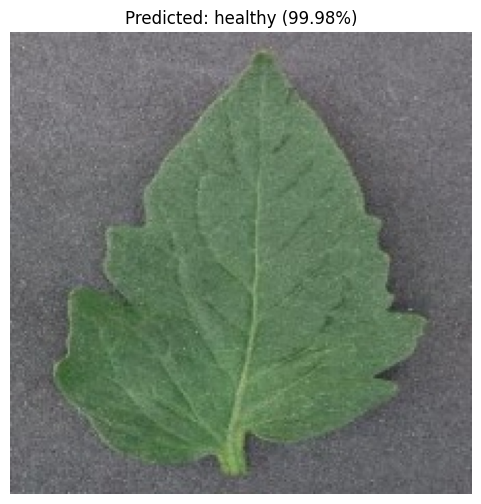

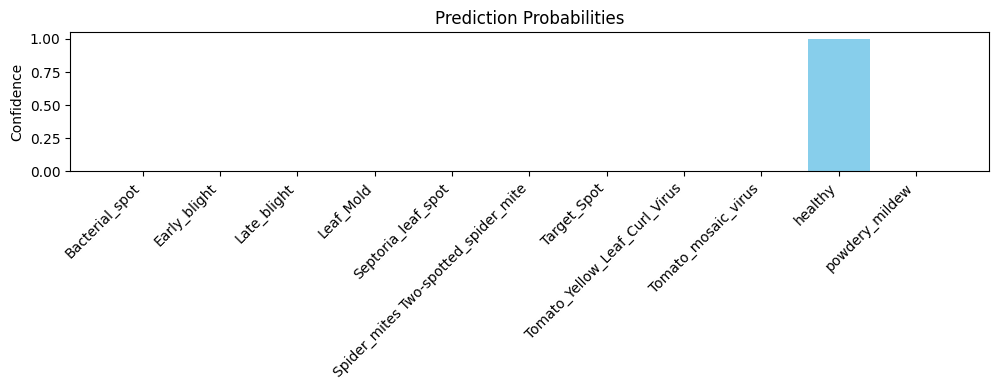

✅ Predicted: healthy (99.98%)


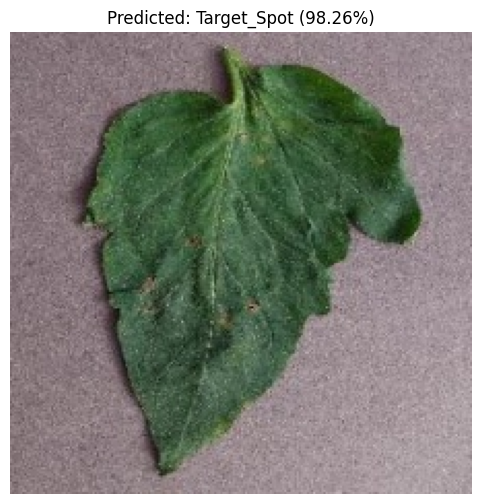

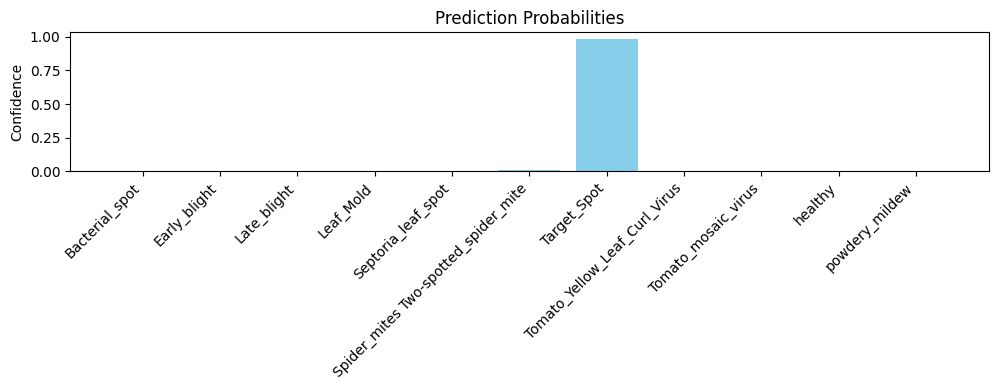

✅ Predicted: Target_Spot (98.26%)


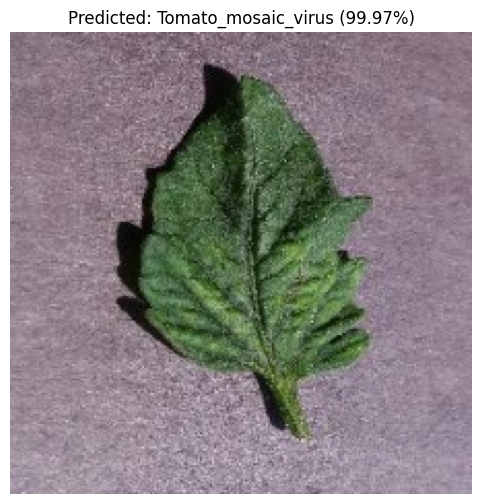

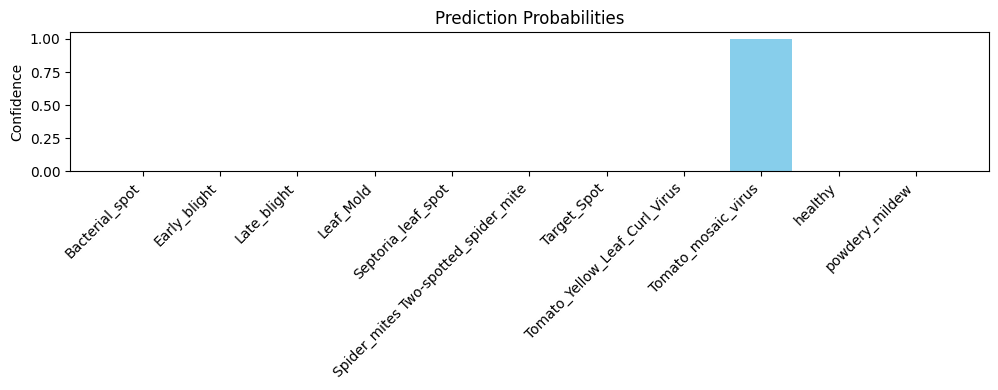

✅ Predicted: Tomato_mosaic_virus (99.97%)


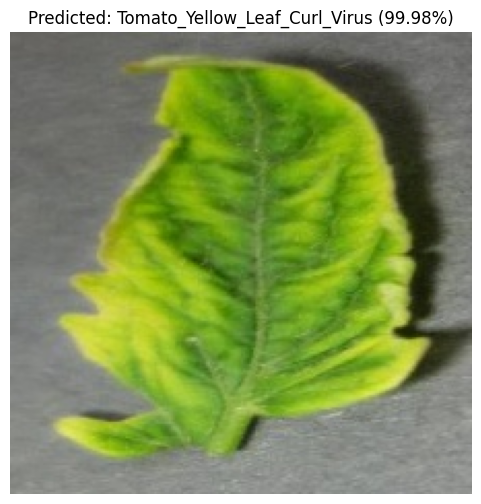

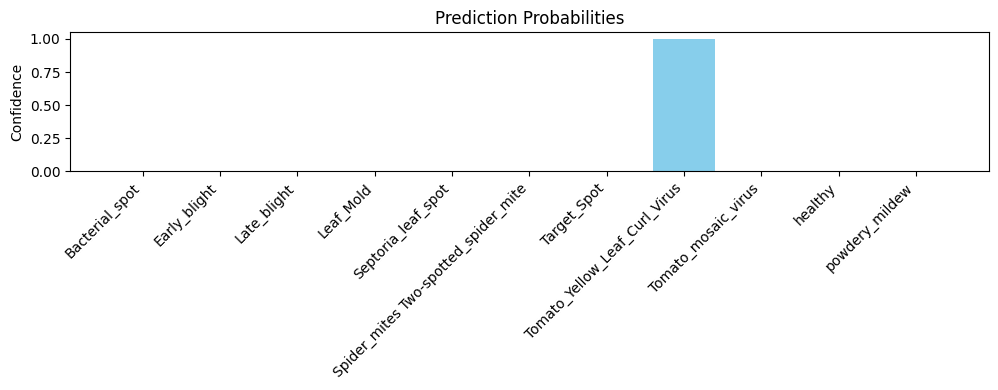

✅ Predicted: Tomato_Yellow_Leaf_Curl_Virus (99.98%)


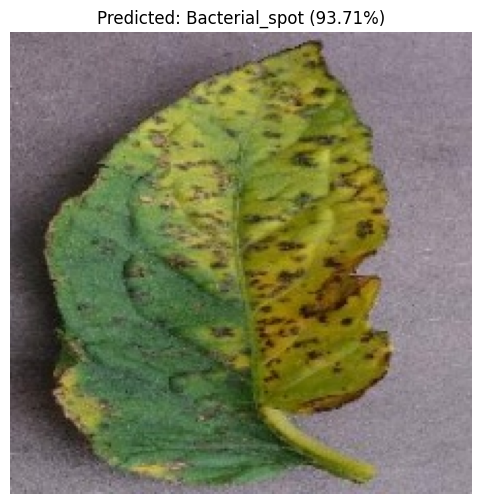

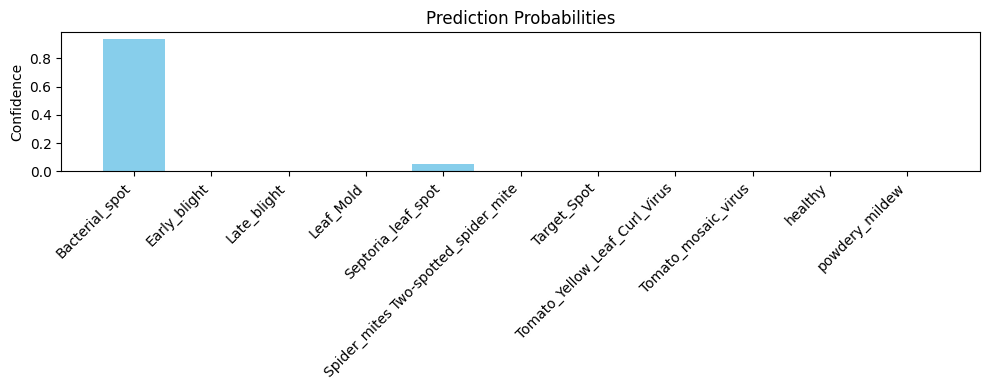

✅ Predicted: Bacterial_spot (93.71%)


In [14]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

# Configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🚀 Using device: {device}")

model_path = "E:\\Intern\\MEGA-MINDS\\Assign 4\\best_model.pth"
img_height, img_width = 224, 224
class_labels = ['Bacterial_spot', 'Early_blight', 'Late_blight', 'Leaf_Mold',
                'Septoria_leaf_spot', 'Spider_mites Two-spotted_spider_mite',
                'Target_Spot', 'Tomato_Yellow_Leaf_Curl_Virus',
                'Tomato_mosaic_virus', 'healthy', 'powdery_mildew']

# Preprocessing pipeline
transform = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),
])

# Load model
model = models.resnet50(pretrained=False)
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 512),
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(0.5),
    nn.Linear(512, len(class_labels)),
    nn.Softmax(dim=1)
)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# Prediction function
def predict_image(img_path):
    image_pil = Image.open(img_path).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(image_tensor)
        probs = outputs.cpu().numpy()[0]
        top_pred = np.argmax(probs)
        top_label = class_labels[top_pred]
        confidence = probs[top_pred]

    # Plotting image with prediction
    plt.figure(figsize=(6, 6))
    plt.imshow(image_pil)
    plt.title(f"Predicted: {top_label} ({confidence*100:.2f}%)")
    plt.axis("off")
    plt.show()

    # Plotting all class probabilities
    plt.figure(figsize=(10, 4))
    plt.bar(class_labels, probs, color='skyblue')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel("Confidence")
    plt.title("Prediction Probabilities")
    plt.tight_layout()
    plt.show()

    return top_label, confidence, probs

# Example usage
image_paths = [
    "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images\\healthy\\21808.jpg",
    "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images\\Target_Spot\\15803.jpg",
    "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images\\Tomato_mosaic_virus\\19669.jpg",
    "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images\\Tomato_Yellow_Leaf_Curl_Virus\\17634.jpg",
    "E:\\Intern\\MEGA-MINDS\\Assign 4\\preprocessed_images\\Bacterial_spot\\27.jpg"
]

for img in image_paths:
    if os.path.exists(img):
        label, conf, all_probs = predict_image(img)
        print(f"✅ Predicted: {label} ({conf*100:.2f}%)")
    else:
        print(f"❌ Image not found: {img}")
